# Making necessary imports

In [1]:
pip install nltk

Note: you may need to restart the kernel to use updated packages.Requirement already satisfied: nltk in c:\users\dell\appdata\local\programs\python\python311\lib\site-packages (3.8.1)




[notice] A new release of pip is available: 23.1.2 -> 24.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [2]:
import pandas as pd
import numpy as np
import os

In [3]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score
import string
import nltk
import json
import glob
import re

In [4]:
nltk.download('stopwords')

[nltk_data] Error loading stopwords: <urlopen error [WinError 10060] A
[nltk_data]     connection attempt failed because the connected party
[nltk_data]     did not properly respond after a period of time, or
[nltk_data]     established connection failed because connected host
[nltk_data]     has failed to respond>


False

In [5]:
from nltk.corpus import stopwords

# Functions for file handling

In [6]:
def load_data(file):
    with open(file, "r", encoding = "utf-8") as f:
        data = [line.strip() for line in f]
        
    return(data)

def write_data(file):
    with open(file,"w",encoding="utf-8") as f:
        json.dump(data,f,indent="4")
        
        

        
        
#with open(file_path,'r',encoding='utf-8') as file:
#   lines = [line.strip() for line in file]
    

# Data Cleaning

In [7]:
def remove_stops(text,stops):
    text = re.sub(r"\[deleted\]","",text)
    text = re.sub(r"\\tundefined","",text)
    text = re.sub(r"\[removed\]","",text)
    text = re.sub(r"&gt","",text)
    text = re.sub(r"undefined","",text)
    words = text.split()
    final = [word for word in words if word.lower() not in stops]

            
    final = " ".join(final)
    final = final.translate(str.maketrans("","", string.punctuation))
    final = "".join([i for i in final if not i.isdigit()])
    
    #while "  " in final:
    #    final = final.replace("  "," ")
        
    return final
            

In [8]:
def clean_docs(docs):
    stops = stopwords.words("english")
    final = []
    for doc in docs:
        clean_doc = remove_stops(str(doc),stops)
        final.append(clean_doc)
        
    return final


# Reading Data

In [9]:
file_path = (r"C:\Users\dell\Desktop\Reddit\easy-reddit-downloader\downloads\AskReddit\file1.txt")

In [10]:
directory = r"C:\Users\dell\Desktop\Reddit\easy-reddit-downloader\downloads\AskReddit"

# Initialize an empty dictionary to store the combined data
combined_data = []

# Loop through the files
for i in range(1, 100):  # Assuming files are numbered from 1 to 100
    file_name = f'file{i}.txt'  # Change the file name format if needed
    file_path = os.path.join(directory, file_name)
    
    # Read and load the JSON data from each file
    with open(file_path, 'r',encoding = 'utf-8') as file:
        combined_data.append([line.strip() for line in file])
        
        
combined_data

[['[Breaking News] Orlando Nightclub mass-shooting. by roastedbagel',
  '',
  '**Update 3:19PM EST:** Updated links below',
  '',
  '**Update 2:03PM EST:** [Man with weapons, explosives on way to LA Gay Pride Event arrested](http://www.latimes.com/local/lanow/la-me-ln-gay-pride-la-weapons-20160612-snap-story.html)',
  '',
  '---',
  '',
  'Over 50 people have been killed, and over 50 more injured at a gay nightclub in Orlando, FL. [CNN link to story](http://www.cnn.com/2016/06/12/us/orlando-nightclub-shooting/index.html)',
  '',
  'Use this thread to discuss the events, share updated info, etc. Please be civil with your discussion and continue to follow /r/AskReddit rules.',
  '',
  '---',
  '',
  '**Helpful Info:**',
  '',
  "~~Orlando Hospitals are asking that people donate blood and plasma as they are in need~~ - They're at capacity, come back in a few days though they're asking, below are some helpful links:",
  '',
  '[Link to blood donation centers in Florida](http://blood-banks.

In [11]:
cleaned_docs = clean_docs(combined_data)


cleaned_docs

['Breaking News Orlando Nightclub massshooting roastedbagel  Update PM EST Updated links below  Update PM EST Man weapons explosives way LA Gay Pride Event arrestedhttpwwwlatimescomlocallanowlamelngaypridelaweaponssnapstoryhtml    Over  people killed  injured gay nightclub Orlando FL CNN link storyhttpwwwcnncomusorlandonightclubshootingindexhtml  Use thread discuss events share updated info etc Please civil discussion continue follow rAskReddit rules    Helpful Info  Orlando Hospitals asking people donate blood plasma need  Theyre capacity come back days though theyre asking helpful links  Link blood donation centers Floridahttpbloodbanksregionaldirectoryusfloridahtm  American Red Crosshttpwwwredcrossorggiveblood OneBloodorg currently unavailable Call REDCROSS  or DONATE   Thanks uJeimsie additional links  FBI Tip Line CALLFBI   Families victims needing info  Official Hotline    Donations  Equality Florida GoFundMe pagehttpswwwgofundmecomPulseVictimsFund victims families theyve confirm

# Vectorizing data

In [13]:
vectorizer = TfidfVectorizer(lowercase=True, max_features=100, max_df = 0.8, min_df=5, ngram_range=(1,3), stop_words="english")

In [14]:
vectors =vectorizer.fit_transform(cleaned_docs)

feature_names = vectorizer.get_feature_names_out()

dense = vectors.todense()
denselist = dense.tolist()

all_keywords = []

for description in denselist:
    x = 0
    keywords = []
    for word in description:
        if word > 0: #if it's an actual word
             keywords.append(feature_names[x])
        x +=1 

    all_keywords.append(keywords)
    
    
print(all_keywords)

[['actually', 'ago', 'ask', 'asked', 'away', 'bad', 'best', 'better', 'called', 'come', 'couple', 'days', 'different', 'dont', 'end', 'family', 'feel', 'free', 'friend', 'friends', 'fuck', 'getting', 'going', 'got', 'great', 'hard', 'help', 'home', 'hours', 'ive', 'kids', 'kind', 'left', 'let', 'life', 'live', 'long', 'look', 'lot', 'love', 'man', 'minutes', 'need', 'new', 'night', 'old', 'person', 'point', 'police', 'post', 'probably', 'read', 'reddit', 'right', 'said', 'saw', 'say', 'saying', 'school', 'shit', 'start', 'started', 'stop', 'thank', 'thanks', 'thats', 'thing', 'things', 'thought', 'told', 'took', 'trying', 'use', 'went', 'work', 'working', 'year'], ['actually', 'ago', 'ask', 'asked', 'away', 'bad', 'best', 'better', 'called', 'came', 'come', 'dad', 'end', 'feel', 'friend', 'fuck', 'getting', 'going', 'got', 'great', 'guy', 'home', 'hours', 'house', 'id', 'ive', 'job', 'later', 'left', 'let', 'life', 'little', 'live', 'long', 'lot', 'love', 'man', 'need', 'new', 'night',

# Using KMeans for Clustering 

In [15]:
true_k = 5
model = KMeans(n_clusters =true_k, init="k-means++", max_iter=100, n_init= 1)

model.fit(vectors)

order_centroids = model.cluster_centers_.argsort()[:,::-1]
terms = vectorizer.get_feature_names_out()

with open("results.txt","w", encoding="utf-8") as f:
    for i in range(true_k):
        f.write(f"Cluster {i}")
        f.write("\n")
        for ind in order_centroids[i,:10]:
            f.write(' %s' %terms[ind],)
            f.write("\n")
            
        f.write("\n")
        f.write("\n")
          
            
#Drawback of KMeans is that it makes a document to conform one topic only

# Visualizing Clusters 

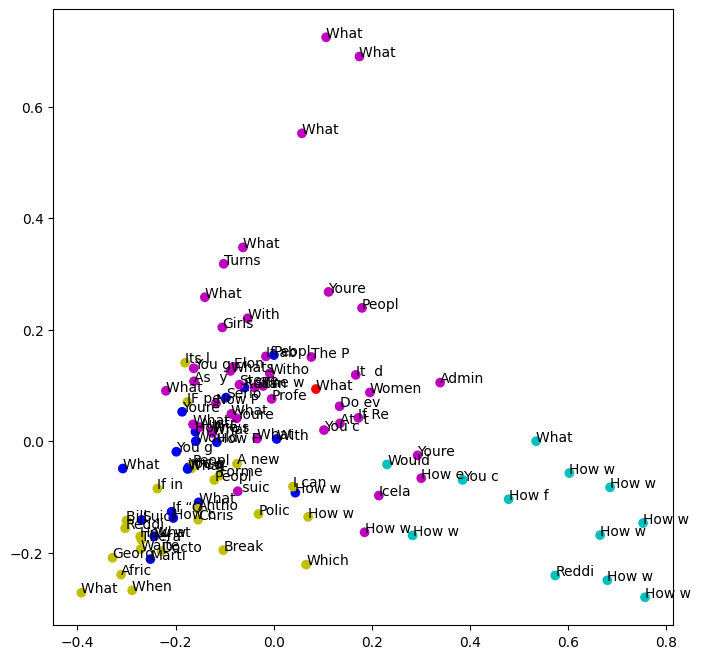

In [16]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

kmeans_indices = model.fit_predict(vectors)

pca = PCA(n_components = 2)
scatter_plot_points = pca.fit_transform(vectors.toarray())

colors = ["r","b","c","y","m"]

x_axis = [o[0] for o in scatter_plot_points]
y_axis = [o[1] for o in scatter_plot_points]

fg,ax = plt.subplots(figsize=(8,8))

ax.scatter(x_axis,y_axis, c = [colors[d] for d in kmeans_indices])

for i,txt in enumerate(cleaned_docs):
    ax.annotate(txt[0:5], (x_axis[i], y_axis[i]))
    
    

    

# LDA

In [17]:
pip install gensim

                                              0.0/24.0 MB ? eta -:--:--
                                              0.0/24.0 MB ? eta -:--:--
                                              0.0/24.0 MB ? eta -:--:--
                                             0.0/24.0 MB 163.8 kB/s eta 0:02:27
                                             0.0/24.0 MB 163.8 kB/s eta 0:02:27
                                             0.0/24.0 MB 163.8 kB/s eta 0:02:27
                                             0.0/24.0 MB 163.8 kB/s eta 0:02:27
                                             0.0/24.0 MB 163.8 kB/s eta 0:02:27
                                             0.0/24.0 MB 163.8 kB/s eta 0:02:27
                                             0.0/24.0 MB 163.8 kB/s eta 0:02:27
                                             0.0/24.0 MB 163.8 kB/s eta 0:02:27
                                             0.0/24.0 MB 163.8 kB/s eta 0:02:27
                                             0.0/24.0 MB 163.8 k


[notice] A new release of pip is available: 23.1.2 -> 24.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [21]:
pip install spacy


[notice] A new release of pip is available: 23.1.2 -> 24.2
[notice] To update, run: python.exe -m pip install --upgrade pip



                                              0.0/12.1 MB ? eta -:--:--
                                             0.0/12.1 MB 320.0 kB/s eta 0:00:38
                                             0.0/12.1 MB 320.0 kB/s eta 0:00:38
                                             0.0/12.1 MB 186.2 kB/s eta 0:01:05
                                             0.0/12.1 MB 186.2 kB/s eta 0:01:05
                                             0.0/12.1 MB 186.2 kB/s eta 0:01:05
                                             0.0/12.1 MB 186.2 kB/s eta 0:01:05
                                             0.0/12.1 MB 186.2 kB/s eta 0:01:05
                                             0.0/12.1 MB 186.2 kB/s eta 0:01:05
                                             0.1/12.1 MB 130.9 kB/s eta 0:01:32
                                             0.1/12.1 MB 145.6 kB/s eta 0:01:23
                                             0.1/12.1 MB 174.7 kB/s eta 0:01:09
                                             0.

In [24]:
pip install pyLDAvis


[notice] A new release of pip is available: 23.1.2 -> 24.2
[notice] To update, run: python.exe -m pip install --upgrade pip



                                              0.0/2.6 MB ? eta -:--:--
                                              0.0/2.6 MB ? eta -:--:--
                                              0.0/2.6 MB 330.3 kB/s eta 0:00:08
                                              0.0/2.6 MB 330.3 kB/s eta 0:00:08
                                              0.0/2.6 MB 330.3 kB/s eta 0:00:08
                                              0.0/2.6 MB 330.3 kB/s eta 0:00:08
                                              0.0/2.6 MB 330.3 kB/s eta 0:00:08
                                              0.0/2.6 MB 330.3 kB/s eta 0:00:08
                                              0.0/2.6 MB 330.3 kB/s eta 0:00:08
                                              0.1/2.6 MB 130.9 kB/s eta 0:00:20
     -                                        0.1/2.6 MB 158.2 kB/s eta 0:00:16
     -                                        0.1/2.6 MB 158.2 kB/s eta 0:00:16
     -                                        0.1/2.6 MB 

In [25]:
#gensim

import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel


#spacy
import spacy
from nltk.corpus import stopwords


#vis
import pyLDAvis
import pyLDAvis.gensim

# Preparing the Data

In [26]:
stopwords = stopwords.words("english")

In [27]:
print(stopwords)

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than', '

In [28]:
directory = r"C:\Users\dell\Desktop\Reddit\easy-reddit-downloader\downloads\AskReddit"

# Initialize an empty dictionary to store the combined data
combined_data = []

# Loop through the files
for i in range(1, 100):  # Assuming files are numbered from 1 to 100
    file_name = f'file{i}.txt'  # Change the file name format if needed
    file_path = os.path.join(directory, file_name)
    
    # Read and load the JSON data from each file
    with open(file_path, 'r',encoding = 'utf-8') as file:
        combined_data.append([line.strip() for line in file])
        
        
combined_data

[['[Breaking News] Orlando Nightclub mass-shooting. by roastedbagel',
  '',
  '**Update 3:19PM EST:** Updated links below',
  '',
  '**Update 2:03PM EST:** [Man with weapons, explosives on way to LA Gay Pride Event arrested](http://www.latimes.com/local/lanow/la-me-ln-gay-pride-la-weapons-20160612-snap-story.html)',
  '',
  '---',
  '',
  'Over 50 people have been killed, and over 50 more injured at a gay nightclub in Orlando, FL. [CNN link to story](http://www.cnn.com/2016/06/12/us/orlando-nightclub-shooting/index.html)',
  '',
  'Use this thread to discuss the events, share updated info, etc. Please be civil with your discussion and continue to follow /r/AskReddit rules.',
  '',
  '---',
  '',
  '**Helpful Info:**',
  '',
  "~~Orlando Hospitals are asking that people donate blood and plasma as they are in need~~ - They're at capacity, come back in a few days though they're asking, below are some helpful links:",
  '',
  '[Link to blood donation centers in Florida](http://blood-banks.

In [31]:
# Download and install the model
spacy.cli.download("en_core_web_sm")

✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restart runtime' option.


In [34]:
def lemmatization(texts,allowed_postags=["NOUN","ADJ","VERB","ADV"]):
    #reduction of words to their roots
    #create a spacy object
    nlp = spacy.load("en_core_web_sm",disable= ["parser","ner"])   #disabling them bcs they are computationally more expensive and are not necessary
    texts_out = []
    
    for text in texts:
        doc = nlp(text)    #it will contain metadata about the information
        new_text = []
        for token in doc:
            if token.pos_ in allowed_postags:
                new_text.append(token.lemma_)   #lemma is the lemmatized form 
                
        final = " ".join(new_text)
        texts_out.append(final)
        
    return texts_out

In [35]:
lemmatized_text = lemmatization(cleaned_docs)

print(lemmatized_text)

['break massshoote roastedbagel update link man weapon explosive way arrestedhttpwwwlatimescomlocallanowlamelngaypridelaweaponssnapstoryhtml people kill injure nightclub link thread discuss event share update info civil discussion continue follow raskreddit rule helpful ask people donate blood plasma need re capacity come back day re ask helpful link blood donation center currently unavailable call redcross donate thank additional link victim need info gofundme pagehttpswwwgofundmecompulsevictimsfund victim family ve confirm page live threadhttpswwwredditcomlivextjnkggwa prop mod consider donate blood plasma come back local blood drive already reach need volume today come back next round need tmustyprawn blood center need water bottle snack well large influx people donate blood donate blood think donate food drink think team deserve recognition here hat go work time tragic event occur especially nurse surgeon take lot gut able keep cool perform duty people frighten stress know people a

In [36]:
def gen_words(texts):
    #to remove stopwords
    final = []
    for text in texts:
        new = gensim.utils.simple_preprocess(text,deacc=True)  #deaccent as data may contain accent marks
        final.append(new)
        
    return final
        

In [38]:
cleaned_ = gen_words(lemmatized_text)

cleaned_

[['break',
  'massshoote',
  'roastedbagel',
  'update',
  'link',
  'man',
  'weapon',
  'explosive',
  'way',
  'people',
  'kill',
  'injure',
  'nightclub',
  'link',
  'thread',
  'discuss',
  'event',
  'share',
  'update',
  'info',
  'civil',
  'discussion',
  'continue',
  'follow',
  'raskreddit',
  'rule',
  'helpful',
  'ask',
  'people',
  'donate',
  'blood',
  'plasma',
  'need',
  're',
  'capacity',
  'come',
  'back',
  'day',
  're',
  'ask',
  'helpful',
  'link',
  'blood',
  'donation',
  'center',
  'currently',
  'unavailable',
  'call',
  'redcross',
  'donate',
  'thank',
  'additional',
  'link',
  'victim',
  'need',
  'info',
  'gofundme',
  'victim',
  'family',
  've',
  'confirm',
  'page',
  'live',
  'prop',
  'mod',
  'consider',
  'donate',
  'blood',
  'plasma',
  'come',
  'back',
  'local',
  'blood',
  'drive',
  'already',
  'reach',
  'need',
  'volume',
  'today',
  'come',
  'back',
  'next',
  'round',
  'need',
  'tmustyprawn',
  'blood',
 

In [66]:
# bigrams and trigrams

#min count means that the minimum number of times the words are viewed together to be counted a bigram
bigram_phrases = gensim.models.Phrases(cleaned_, min_count =5, threshold=100 )
trigram_phrases = gensim.models.Phrases(bigram_phrases[cleaned_], threshold=100)   #higher the threshold means lesser the phrases which is better for us. So we can have better clusters

bigram = gensim.models.phrases.Phraser(bigram_phrases)
trigram = gensim.models.phrases.Phraser(trigram_phrases)


def make_bigram(texts):
    return (bigram[doc] for doc in texts)


def make_trigram(texts):
    return (trigram[doc] for doc in texts)

data_bigrams = make_bigram(cleaned_)
data_bigrams_trigrams = make_trigram(data_bigrams)

data_bigrams_trigrams = list(data_bigrams_trigrams)

print(data_bigrams_trigrams[0])    #bigrams and trigrams contain underscores as you can see


['break', 'massshoote', 'roastedbagel', 'update', 'link', 'man', 'weapon', 'explosive', 'way', 'people', 'kill', 'injure', 'nightclub', 'link', 'thread', 'discuss', 'event', 'share', 'update', 'info', 'civil', 'discussion', 'continue', 'follow', 'raskreddit', 'rule', 'helpful', 'ask', 'people', 'donate_blood', 'plasma', 'need', 're', 'capacity', 'come', 'back', 'day', 're', 'ask', 'helpful', 'link', 'blood', 'donation', 'center', 'currently', 'unavailable', 'call', 'redcross', 'donate', 'thank', 'additional', 'link', 'victim', 'need', 'info', 'gofundme', 'victim', 'family', 've', 'confirm', 'page', 'live', 'prop', 'mod', 'consider', 'donate_blood', 'plasma', 'come', 'back', 'local', 'blood', 'drive', 'already', 'reach', 'need', 'volume', 'today', 'come', 'back', 'next', 'round', 'need', 'tmustyprawn', 'blood', 'center', 'need', 'water', 'bottle', 'snack', 'well', 'large', 'influx', 'people', 'donate_blood', 'donate_blood', 'think', 'donate', 'food', 'drink', 'think', 'team', 'deserve',

In [69]:
#tf-idf removal


#we are removing frequently occuring words that is a big problem , there are words that are not important for topic

#sometimes important words are left off because these unimportant words occur with a certain frequency or threshold in the entire corpus


from gensim.models import TfidfModel

id2word =corpora.Dictionary(data_bigrams_trigrams)

texts = data_bigrams_trigrams

corpus = [id2word.doc2bow(text) for text in texts]


In [70]:
corpus #corpus  is a list of tuples, the first element indicates the word in the text and the second element indicates the frequency

[[(0, 1),
  (1, 2),
  (2, 1),
  (3, 2),
  (4, 1),
  (5, 2),
  (6, 1),
  (7, 1),
  (8, 1),
  (9, 4),
  (10, 2),
  (11, 3),
  (12, 1),
  (13, 2),
  (14, 1),
  (15, 1),
  (16, 1),
  (17, 1),
  (18, 1),
  (19, 1),
  (20, 1),
  (21, 1),
  (22, 2),
  (23, 1),
  (24, 1),
  (25, 1),
  (26, 3),
  (27, 1),
  (28, 2),
  (29, 1),
  (30, 3),
  (31, 1),
  (32, 1),
  (33, 1),
  (34, 2),
  (35, 1),
  (36, 1),
  (37, 1),
  (38, 1),
  (39, 1),
  (40, 1),
  (41, 2),
  (42, 1),
  (43, 4),
  (44, 1),
  (45, 1),
  (46, 3),
  (47, 1),
  (48, 5),
  (49, 3),
  (50, 1),
  (51, 1),
  (52, 1),
  (53, 3),
  (54, 1),
  (55, 1),
  (56, 1),
  (57, 1),
  (58, 1),
  (59, 1),
  (60, 1),
  (61, 5),
  (62, 1),
  (63, 4),
  (64, 1),
  (65, 1),
  (66, 1),
  (67, 1),
  (68, 1),
  (69, 1),
  (70, 1),
  (71, 1),
  (72, 2),
  (73, 1),
  (74, 1),
  (75, 4),
  (76, 1),
  (77, 2),
  (78, 2),
  (79, 1),
  (80, 1),
  (81, 2),
  (82, 1),
  (83, 7),
  (84, 1),
  (85, 3),
  (86, 2),
  (87, 1),
  (88, 1),
  (89, 4),
  (90, 3),
  (91, 1)

In [98]:
tfidf = TfidfModel(corpus, id2word = id2word)

low_value = 0.05

words = []

words_missing_in_tfidf = []

for i in range(0, len(corpus)):
    bow = corpus[i]
    low_value_words = [] #reinitialize to be safe. You can skip this.
    tfidf_ids = [id for id, value in tfidf[bow]]
    bow_ids = [id for id, value in bow]
    low_value_words = [id for id, value in tfidf[bow] if value < low_value]
    words_missing_in_tfidf = [id for id in bow_ids if id not in tfidf_ids] # The words with tf-idf socre 0 will be missing
    drops = words_missing_in_tfidf + low_value_words
    for item in drops:
        words.append(id2word[item])
    new_bow = [b for b in bow if b[0] not in low_value_words and b[0] not in words_missing_in_tfidf]  

#reassign        
    corpus[i] = new_bow
    
    
corpus

[[(9, 4),
  (49, 3),
  (83, 7),
  (99, 3),
  (105, 7),
  (120, 14),
  (160, 6),
  (178, 8),
  (189, 9),
  (202, 3),
  (204, 9),
  (212, 3),
  (220, 10),
  (224, 6),
  (226, 4),
  (230, 4),
  (238, 9),
  (250, 10),
  (257, 3),
  (263, 17),
  (274, 7),
  (278, 4),
  (288, 5),
  (289, 4),
  (290, 10),
  (301, 8),
  (307, 4),
  (332, 6),
  (334, 9),
  (347, 4),
  (358, 4),
  (363, 4),
  (390, 3),
  (392, 5),
  (435, 4),
  (436, 3),
  (452, 8),
  (466, 4),
  (474, 4),
  (479, 7),
  (489, 10),
  (500, 9),
  (503, 4),
  (506, 4),
  (512, 8),
  (532, 3),
  (536, 7),
  (545, 3),
  (562, 3),
  (590, 3),
  (591, 4),
  (595, 5),
  (597, 5),
  (605, 3),
  (608, 6),
  (623, 4),
  (646, 13),
  (647, 8),
  (648, 5),
  (650, 4),
  (658, 5),
  (694, 7),
  (706, 6),
  (714, 4),
  (727, 4),
  (750, 8),
  (759, 6),
  (760, 4),
  (761, 7),
  (763, 6),
  (764, 5),
  (794, 11)],
 [(195, 32),
  (241, 4),
  (329, 6),
  (386, 7),
  (462, 3),
  (494, 12),
  (510, 9),
  (653, 5),
  (668, 3),
  (705, 3),
  (828, 11

In [77]:
#getting the word

word = id2word[[9][:1][0]]
word

'act'

In [113]:
lda_model = gensim.models.ldamodel.LdaModel(corpus = corpus, id2word = id2word, num_topics = 20, 
                                           random_state = 150, update_every = 1, chunksize= 100, passes=20,alpha='auto')



# Visualizing Data

In [116]:
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim.prepare(lda_model,corpus, id2word, mds='mmds',R=40)

vis

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
5     -0.329048 -0.159349       1        1  15.266337
1     -0.351902  0.048681       2        1  12.763162
9     -0.151864 -0.245302       3        1   7.634015
14    -0.000815 -0.284347       4        1   6.852350
16    -0.043499  0.291061       5        1   6.778671
7     -0.126789  0.238233       6        1   6.197613
11    -0.202361  0.147835       7        1   5.491329
8     -0.185546 -0.107860       8        1   5.154895
18     0.182848 -0.269574       9        1   5.023831
4      0.236215 -0.116695      10        1   3.713905
12     0.076559 -0.155822      11        1   3.630135
19     0.258420  0.150684      12        1   3.511761
10    -0.143935  0.026679      13        1   3.506555
13    -0.004490 -0.029639      14        1   3.432658
15     0.033595  0.139638      15        1   2.549302
2      0.140354  0.224399      16        1   2.357233
17     0.124544 -0.027861      17        1   1.911296
0      0.221769 -0.000508      18        1   1.879962
3      0.172997  0.072597      19        1   1.548333
6      0.092950  0.057151      20        1   0.796657, topic_info=          Term        Freq       Total Category  logprob  loglift
423       look  169.000000  169.000000  Default  40.0000  40.0000
262       free  110.000000  110.000000  Default  39.0000  39.0000
625        say  122.000000  122.000000  Default  38.0000  38.0000
785        use  104.000000  104.000000  Default  37.0000  37.0000
245       feel  148.000000  148.000000  Default  36.0000  36.0000
...        ...         ...         ...      ...      ...      ...
799       wait    0.527877   29.832069  Topic20  -6.1106   0.7980
59        away    0.527659   43.505836  Topic20  -6.1110   0.4203
961     ignore    0.270282    9.128038  Topic20  -6.7800   1.3129
3523    define    0.270227    3.794470  Topic20  -6.7802   2.1905
462   multiple    0.270220    4.550369  Topic20  -6.7803   2.0088

[1609 rows x 6 columns], token_table=      Topic      Freq     Term
term                          
3868     10  0.808454   abduct
4764     13  0.658966   abuser
4         1  0.480798  abusive
4        13  0.480798  abusive
9527      9  0.891108  academy
...     ...       ...      ...
823       5  0.281296     year
1185      5  0.520760    young
1185     11  0.130190    young
1185     13  0.325475    young
7066     18  0.507381  youtube

[2450 rows x 3 columns], R=40, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[6, 2, 10, 15, 17, 8, 12, 9, 19, 5, 13, 20, 11, 14, 16, 3, 18, 1, 4, 7])